<a href="https://colab.research.google.com/github/drFahlan/Arrhythmia-types-classification/blob/main/notebooks/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%pwd

'/content'

#check folder

In [ ]:
import os

# Define the folder path
folder_path = "/content/drive/Othercomputers/MyLaptop/Downloads/PhysioNet CSV Clean-20230629T041657Z-001/PhysioNet CSV Clean"

# Initialize counters
model_count = 0
csv_count = 0
metadata_count = 0

# Iterate through the files in the folder
for file_name in os.listdir(folder_path):
    # Check for model files (.h5)
    if file_name.endswith(".h5"):
        model_count += 1
    # Check for CSV files
    elif file_name.endswith(".csv"):
        if "RECORDS" in file_name:
            metadata_count += 1
        else:
            csv_count += 1

# Print the counts
print(f"Model files (.h5): {model_count}")
print(f"Patient CSV files: {csv_count}")
print(f"Metadata files: {metadata_count}")

Model files (.h5): 5
Patient CSV files: 294
Metadata files: 2


#load model and dataset

In [ ]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Load metadata from RECORDS_1 and RECORDS_2 (skipping the headers)
records_1_path = os.path.join(folder_path, "RECORDS_1.csv")
records_2_path = os.path.join(folder_path, "RECORDS_2.csv")

# Read the files and skip the headers
records_1 = pd.read_csv(records_1_path, skiprows=1, header=None)
records_2 = pd.read_csv(records_2_path, skiprows=1, header=None)

# Combine both RECORDS files into a single DataFrame
metadata = pd.concat([records_1, records_2], ignore_index=True)
metadata.columns = ["file", "label","unk"]  # Rename columns for clarity

# Initialize data and labels
data = []
labels = []

# Load patient CSV files
for _, row in metadata.iterrows():
    csv_file = f"{row['file']}.csv"
    label = row['label']

    # Read patient data (skip the header row in each patient CSV)
    patient_data = pd.read_csv(os.path.join(folder_path, csv_file), skiprows=1)
    ekg = patient_data.iloc[:, 0].values  # First column (EKG)
    ppg = patient_data.iloc[:, 1].values  # Second column (PPG)

    # Combine EKG and PPG as features
    combined = np.stack((ekg, ppg), axis=1)
    data.append(combined)
    labels.append(label)

# Convert to numpy arrays
data = np.array(data, dtype=object)
labels = np.array(labels)


#EDA

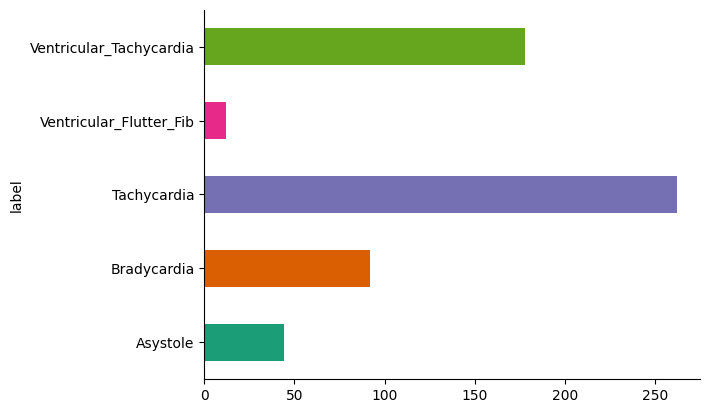

In [ ]:
# @title label

from matplotlib import pyplot as plt
import seaborn as sns
metadata.groupby('label').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# Display the first few rows of metadata
metadata.head()


,file,label,unk
0,t106s,Tachycardia,1
1,t107l,Tachycardia,1
2,t108s,Tachycardia,1
3,t110s,Tachycardia,1
4,t112s,Tachycardia,1


In [ ]:
# Number of labels
print("Number of labels:", len(labels))

# Unique labels and their counts
unique_labels, label_counts = np.unique(labels, return_counts=True)
print("Label Distribution:")
for label, count in zip(unique_labels, label_counts):
    print(f"Label: {label}, Count: {count}")


Number of labels: 588
Label Distribution:
Label: Asystole, Count: 44
Label: Bradycardia, Count: 92
Label: Tachycardia, Count: 262
Label: Ventricular_Flutter_Fib, Count: 12
Label: Ventricular_Tachycardia, Count: 178


## data

In [ ]:
data[0]

array([[2567.0, 8057.0],
       [3576.0, 8073.0],
       [4648.0, 8072.0],
       ...,
       [875.0, 7634.0],
       [879.0, 7658.0],
       [2.0, nan]], dtype=object)

In [ ]:
# Number of patients
print("Number of patients:", len(data))

# Shape of first patient data (number of time points, 2 for ECG and PPG)
print("Shape of the first patient data:", data[0].shape)

# Check combined dimensions
print("Data type and dimensions of the array:", data.dtype, data.shape)


Number of patients: 588
Shape of the first patient data: (3750, 2)
Data type and dimensions of the array: object (588, 3750, 2)


In [ ]:
# Check lengths of ECG and PPG for each patient
signal_lengths = [len(patient) for patient in data]
print("Minimum signal length:", min(signal_lengths))
print("Maximum signal length:", max(signal_lengths))
print("Average signal length:", np.mean(signal_lengths))


Minimum signal length: 3750
Maximum signal length: 3750
Average signal length: 3750.0


In [ ]:
print(f"Data type: {data.dtype}")


Data type: object


In [ ]:
# Extract the last row for all segments
last_row = data[:, -1, :]

# Display a sample of the last row
print("Last row for the first 5 samples:")
print(last_row[:5])


Last row for the first 5 samples:
[[2.0 nan]
 [2.0 nan]
 [2.0 nan]
 [2.0 nan]
 [2.0 nan]]


In [ ]:
# Now exclude the last row
data = data[:, :-1, :]  # Remove the last row
print(data.shape)


(588, 3749, 2)


In [ ]:
import numpy as np

# Convert object array to float
def safe_float_conversion(x):
    try:
        return float(x)
    except (ValueError, TypeError):
        return np.nan  # Replace invalid entries with NaN

# Apply conversion to the entire array
data = np.array([[[safe_float_conversion(value) for value in row] for row in sample] for sample in data])


In [ ]:
# Check for NaN values in the dataset
has_nan = np.isnan(data).any()
nan_count = np.isnan(data).sum()

print(f"Are there any NaN values? {has_nan}")
print(f"Total number of NaN values: {nan_count}")

# Locate samples with NaN values
nan_locations = np.argwhere(np.isnan(data))
print(f"Locations of NaN values: {nan_locations}")


Are there any NaN values? False
Total number of NaN values: 0
Locations of NaN values: []


In [ ]:
# Split ECG and PPG from the data
ecg_data = data[:, :, 0]  # ECG signal
ppg_data = data[:, :, 1]  # PPG signal

# Get amplitude range
ecg_min, ecg_max = np.min(ecg_data), np.max(ecg_data)
ppg_min, ppg_max = np.min(ppg_data), np.max(ppg_data)

print(f"ECG Amplitude Range: [{ecg_min}, {ecg_max}]")
print(f"PPG Amplitude Range: [{ppg_min}, {ppg_max}]")


ECG Amplitude Range: [-32768.0, 32767.0]
PPG Amplitude Range: [-6934.0, 32767.0]


In [ ]:
# Check for infinite values
has_inf = np.isinf(data).any()
inf_count = np.isinf(data).sum()

print(f"Are there any infinite values? {has_inf}")
print(f"Total number of infinite values: {inf_count}")

# Locate samples with infinite values
inf_locations = np.argwhere(np.isinf(data))
print(f"Locations of infinite values: {inf_locations}")


Are there any infinite values? False
Total number of infinite values: 0
Locations of infinite values: []


### ecg

In [ ]:
# Define a function to check for flatlined segments based on variation
def detect_flat_segments(data, threshold, window_size):
    flat_segments = []
    for i in range(data.shape[0]):
        ecg_signal = data[i, :, 0]  # Extract ECG signal for the sample
        # Compute absolute differences between consecutive samples
        diff = np.abs(np.diff(ecg_signal))
        # Sliding window to check if variation stays below the threshold
        for j in range(len(diff) - window_size + 1):
            if np.all(diff[j:j + window_size] < threshold):
                flat_segments.append(i)
                break  # No need to check further if a flatline is found
    return flat_segments

# Detect flatlined segments
flat_segments = detect_flat_segments(data, threshold=5, window_size=75)

print(f"Number of flatlined segments: {len(flat_segments)}")
print(f"Flatlined segment indices: {flat_segments}")


Number of flatlined segments: 12
Flatlined segment indices: [47, 107, 125, 157, 164, 205, 341, 401, 419, 451, 458, 499]


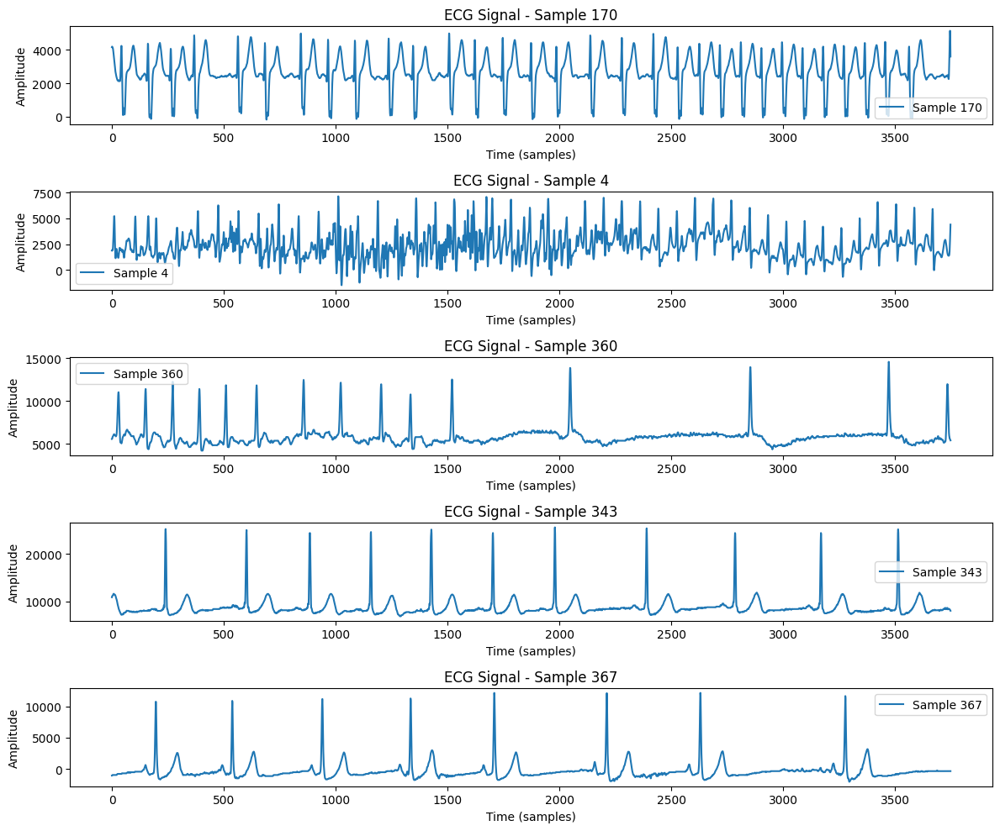

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

plt.figure(figsize=(12, 10))

# Plot 5 random ECG signals
for i in range(5):
    # Select a random sample index
    sample_index = random.randint(0, data.shape[0] - 1)  # Use 'data_cleaned' if preprocessing was done
    ecg_signal = data[sample_index, :, 0]  # Extract ECG data

    # Plot ECG
    plt.subplot(5, 1, i + 1)
    plt.plot(ecg_signal, label=f"Sample {sample_index}")
    plt.title(f"ECG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()


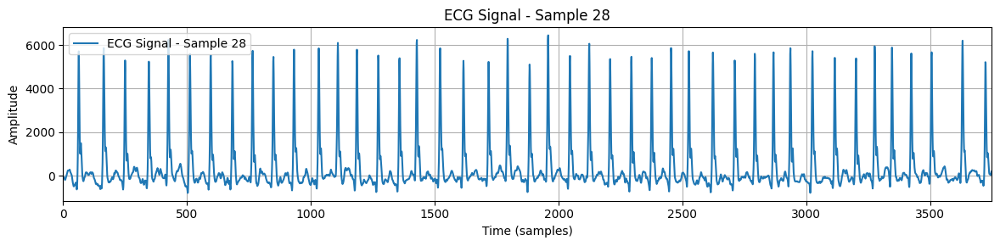

In [ ]:
# List of sample indices to display
variable = [28]
sample_indexes = variable  # Replace 'variable' with the list of desired indices (e.g., [0, 1, 2, 3, 4])

plt.figure(figsize=(12, len(sample_indexes) * 3))  # Adjust figure height based on the number of samples

for i, sample_index in enumerate(sample_indexes):
    ecg_signal = data[sample_index, :, 0]  # Extract ECG signal for the sample
    signal_length = len(ecg_signal)  # Get the length of the ECG signal

    # Create a subplot for each ECG signal
    plt.subplot(len(sample_indexes), 1, i + 1)
    plt.plot(ecg_signal, label=f"ECG Signal - Sample {sample_index}")
    plt.title(f"ECG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.xlim(0, signal_length)  # Dynamically adjust x-axis to the full length of the signal

plt.tight_layout()
plt.show()


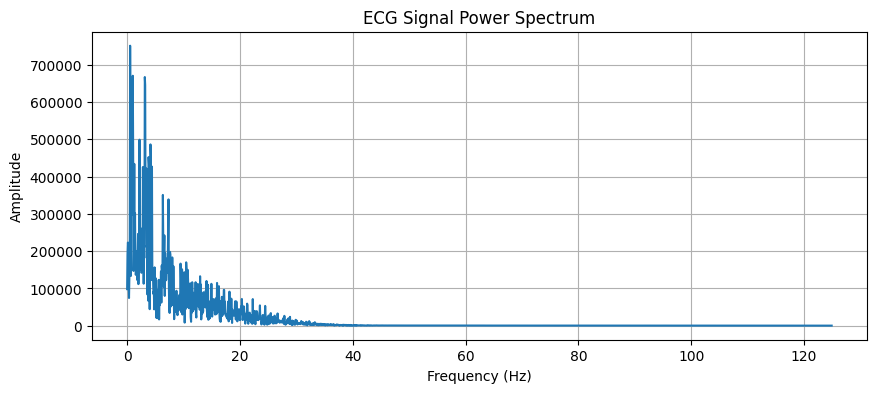

In [ ]:
from scipy.fft import fft, fftfreq

sample_index=10

# Analyze one ECG signal
fs = 250  # Sampling rate (example, adjust if known)
n = data.shape[1]  # Number of samples
ecg_signal = data[sample_index, :, 0]

# Compute FFT
ecg_fft = np.abs(fft(ecg_signal))
freqs = fftfreq(n, 1 / fs)

# Plot Power Spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:n // 2], ecg_fft[:n // 2])  # Plot positive frequencies
plt.title("ECG Signal Power Spectrum")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.grid()
plt.show()


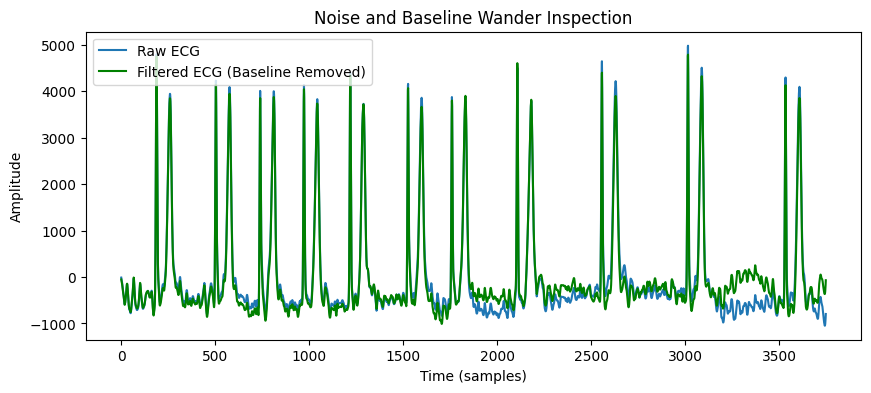

In [ ]:
from scipy.signal import butter, filtfilt

# Define high-pass filter (remove baseline wander)
def highpass_filter(signal, cutoff, fs, order=4):
    b, a = butter(order, cutoff / (0.5 * fs), btype="high")
    return filtfilt(b, a, signal)

# Filter the ECG signal
ecg_filtered = highpass_filter(data[sample_index, :, 0], cutoff=0.5, fs=fs)

# Compare filtered and unfiltered signals
plt.figure(figsize=(10, 4))
plt.plot(data[sample_index, :, 0], label="Raw ECG")
plt.plot(ecg_filtered, label="Filtered ECG (Baseline Removed)", color="green")
plt.title("Noise and Baseline Wander Inspection")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")
plt.legend()
plt.show()


### ppg

In [ ]:
# Define a function to check for flatlined segments based on variation
def detect_flat_segments(data, threshold, window_size):
    flat_segments = []
    for i in range(data.shape[0]):
        ppg_signal = data[i, :, 1]  # Extract ECG signal for the sample
        # Compute absolute differences between consecutive samples
        diff = np.abs(np.diff(ecg_signal))
        # Sliding window to check if variation stays below the threshold
        for j in range(len(diff) - window_size + 1):
            if np.all(diff[j:j + window_size] < threshold):
                flat_segments.append(i)
                break  # No need to check further if a flatline is found
    return flat_segments

# Detect flatlined segments
flat_segments = detect_flat_segments(data, threshold=400, window_size=75)

print(f"Number of flatlined segments: {len(flat_segments)}")
print(f"Flatlined segment indices: {flat_segments}")


Number of flatlined segments: 588
Flatlined segment indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209

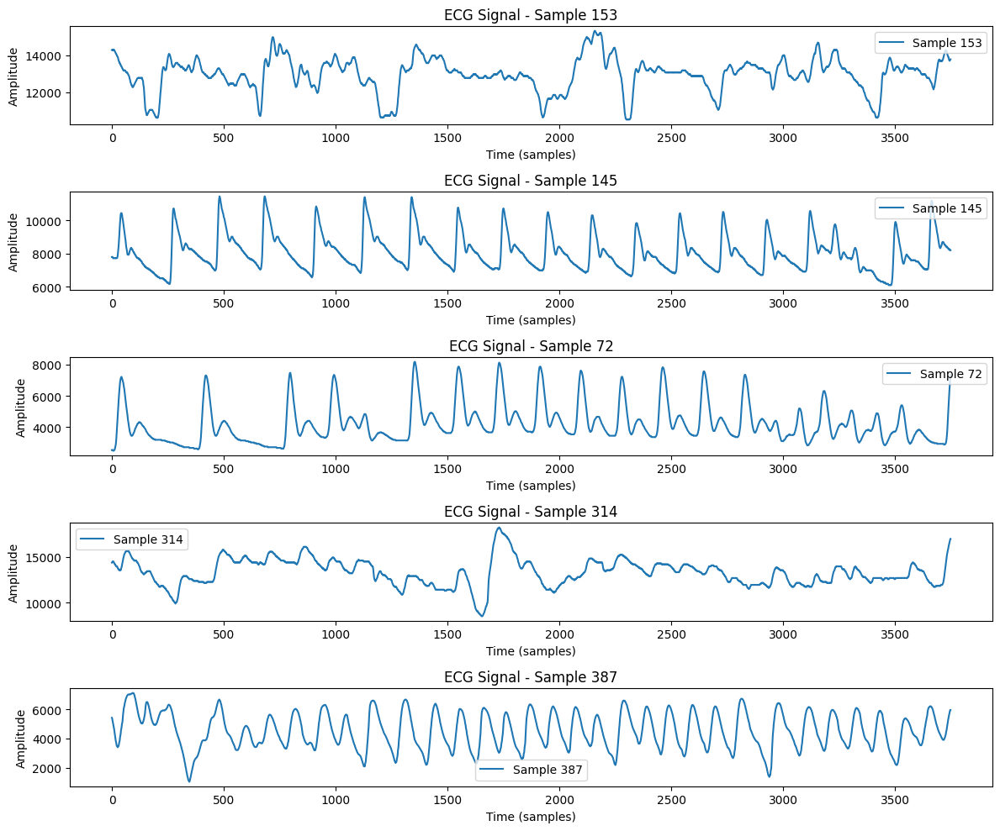

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

plt.figure(figsize=(12, 10))

# Plot 5 random ECG signals
for i in range(5):
    # Select a random sample index
    sample_index = random.randint(0, data.shape[0] - 1)  # Use 'data_cleaned' if preprocessing was done
    ppg_signal = data[sample_index, :, 1]  # Extract ECG data

    # Plot ECG
    plt.subplot(5, 1, i + 1)
    plt.plot(ppg_signal, label=f"Sample {sample_index}")
    plt.title(f"ECG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()


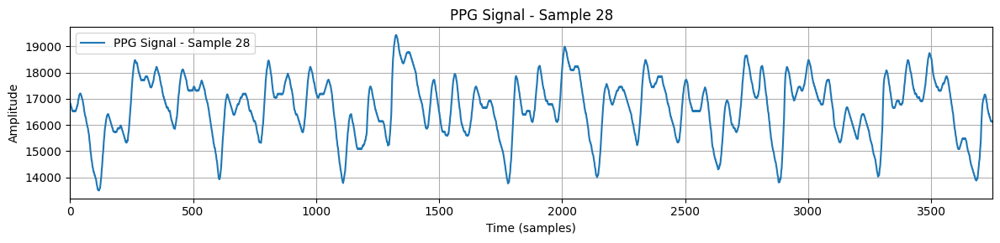

In [ ]:
# List of sample indices to display
variable = [28]
sample_indexes = variable  # Replace 'variable' with the list of desired indices (e.g., [0, 1, 2, 3, 4])

plt.figure(figsize=(12, len(sample_indexes) * 3))  # Adjust figure height based on the number of samples

for i, sample_index in enumerate(sample_indexes):
    ppg_signal = data[sample_index, :, 1]  # Extract ECG signal for the sample
    signal_length = len(ppg_signal)  # Get the length of the ECG signal

    # Create a subplot for each ECG signal
    plt.subplot(len(sample_indexes), 1, i + 1)
    plt.plot(ppg_signal, label=f"PPG Signal - Sample {sample_index}")
    plt.title(f"PPG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.xlim(0, 3749)  # Dynamically adjust x-axis to the full length of the signal

plt.tight_layout()
plt.show()


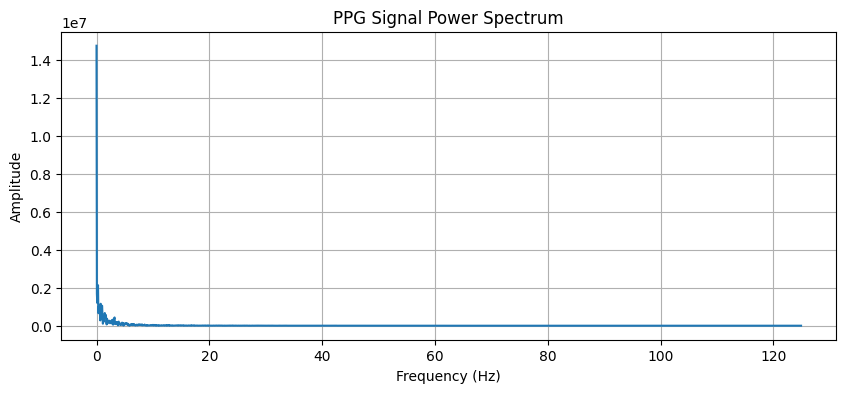

In [ ]:
from scipy.fft import fft, fftfreq

sample_index=190

# Analyze one PPG signal
fs = 250  # Sampling rate (example, adjust if known)
n = data.shape[1]  # Number of samples
ppg_signal = data[sample_index, :, 1]

# Compute FFT
ppg_fft = np.abs(fft(ppg_signal))
freqs = fftfreq(n, 1 / fs)

# Plot Power Spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:n // 2], ppg_fft[:n // 2])  # Plot positive frequencies
plt.title("PPG Signal Power Spectrum")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.grid()
plt.show()


Data errors :



1. 124, ppg data as ecg data
2. 257 & 251 & 416, has flat line
3. most of them has baseline wander
4. and sudden noises that disturbs the ecg morphology



# training - un pre-prcessed data


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import numpy as np

# Normalize the data (optional, depending on range)
data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(data_normalized, labels, test_size=0.2, random_state=42)

# Encode labels (if not already one-hot encoded)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# One-hot encode the labels
y_train_onehot = to_categorical(y_train_encoded)
y_test_onehot = to_categorical(y_test_encoded)

# Print shapes to confirm
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train_onehot.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test_onehot.shape}")


X_train shape: (470, 3749, 2), y_train shape: (470, 5)
X_test shape: (118, 3749, 2), y_test shape: (118, 5)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.regularizers import l2

# Define a simpler pure CNN model
model1 = Sequential([
    # Input Layer
    Input(shape=(3749, 2), name="inputs_cnn"),

    # First Convolutional Block
    Conv1D(filters=32, kernel_size=7, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_1"),
    BatchNormalization(name="batch_norm_1"),
    MaxPooling1D(pool_size=3, name="max_pooling1d_1"),
    Dropout(0.3, name="dropout_1"),

    # Second Convolutional Block
    Conv1D(filters=64, kernel_size=5, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_2"),
    BatchNormalization(name="batch_norm_2"),
    MaxPooling1D(pool_size=3, name="max_pooling1d_2"),
    Dropout(0.3, name="dropout_2"),

    # Third Convolutional Block
    Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_3"),
    BatchNormalization(name="batch_norm_3"),
    MaxPooling1D(pool_size=2, name="max_pooling1d_3"),
    Dropout(0.4, name="dropout_3"),

    # Flatten and Fully Connected Layers
    Flatten(name="flatten"),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001), name="dense_1"),
    Dropout(0.5, name="dropout_4"),
    Dense(5, activation='softmax', name="main_output")  # Adjust the output size for the number of classes
])

# Compile the model
model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model1.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)                    │ (None, 3743, 32)            │             480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm_1 (BatchNormalization)    │ (None, 3743, 32)            │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 1247, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1247, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 1243, 64)            │          10,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm_2 (BatchNormalization)    │ (None, 1243, 64)            │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 414, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 414, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 412, 128)            │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm_3 (BatchNormalization)    │ (None, 412, 128)            │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 206, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 206, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 26368)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │       1,687,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ main_output (Dense)                  │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,724,325 (6.58 MB)

 Trainable params: 1,723,877 (6.58 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define file path to save best weights
checkpoint_path = "/content/drive/Othercomputers/MyLaptop/Downloads/PhysioNet CSV Clean-20230629T041657Z-001/baseline03.weights.h5"

# Model checkpoint to save best weights based on validation accuracy
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=True,
    verbose=0  # Suppress save messages
)

In [ ]:
# Early stopping based on validation accuracy
early_stopping = EarlyStopping(
    monitor='val_accuracy', patience=200, restore_best_weights=True, verbose=0
)

# Train the model
history = model1.fit(
    X_train, y_train_onehot,
    validation_data=(X_test, y_test_onehot),
    epochs=200,
    batch_size=32,
    verbose=1,  # Set to 0 for no output, 1 for progress bar, or 2 for one line per epoch
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 11s 401ms/step - accuracy: 0.3570 - loss: 4.8323 - val_accuracy: 0.1695 - val_loss: 3.1155
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 527ms/step - accuracy: 0.3792 - loss: 1.9854 - val_accuracy: 0.1695 - val_loss: 4.7575
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 359ms/step - accuracy: 0.4676 - loss: 1.6655 - val_accuracy: 0.1695 - val_loss: 5.6872
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 358ms/step - accuracy: 0.4755 - loss: 1.6557 - val_accuracy: 0.1695 - val_loss: 7.2552
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 7s 446ms/step - accuracy: 0.5185 - loss: 1.5361 - val_accuracy: 0.1695 - val_loss: 9.3695
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 9s 344ms/step - accuracy: 0.4938 - loss: 1.5913 - val_accuracy: 0.1695 - val_loss: 10.0581
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 350ms/step - accuracy: 0.5991 - loss: 1.3641 - val_accuracy: 0.1695 - val_loss: 9.4322
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 386ms/step - accuracy: 0.5605 - loss: 1.3614 - val_

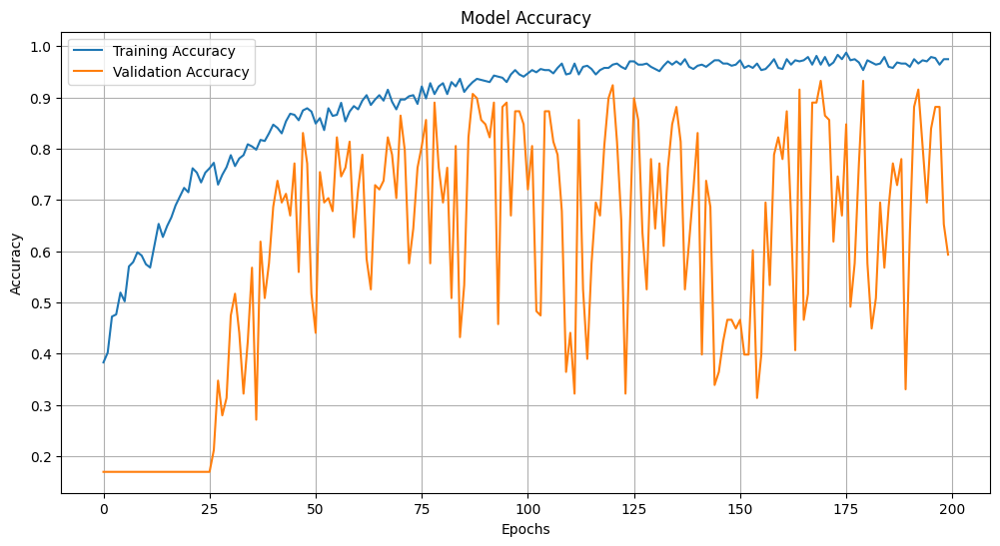

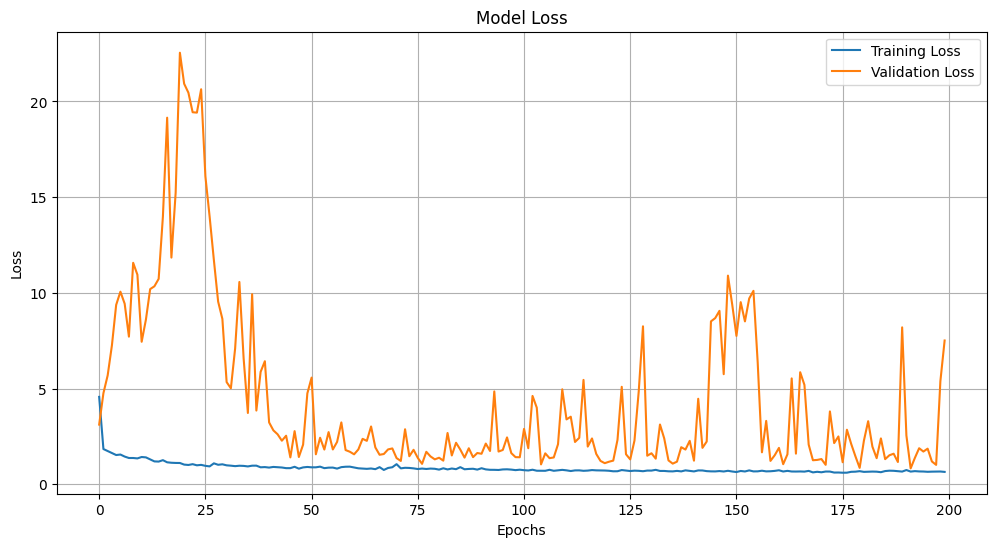

In [ ]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

# Plot loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, BatchNormalization, MaxPooling1D, Dropout, Flatten, Dense
from tensorflow.keras.regularizers import l2

# Define the model architecture
def create_model():
    inputs = Input(shape=(3749, 2), name="inputs_cnn")

    # First Convolutional Block
    x = Conv1D(filters=32, kernel_size=7, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_1")(inputs)
    x = BatchNormalization(name="batch_norm_1")(x)
    x = MaxPooling1D(pool_size=3, name="max_pooling1d_1")(x)
    x = Dropout(0.3, name="dropout_1")(x)

    # Second Convolutional Block
    x = Conv1D(filters=64, kernel_size=5, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_2")(x)
    x = BatchNormalization(name="batch_norm_2")(x)
    x = MaxPooling1D(pool_size=3, name="max_pooling1d_2")(x)
    x = Dropout(0.3, name="dropout_2")(x)

    # Third Convolutional Block
    x = Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_3")(x)
    x = BatchNormalization(name="batch_norm_3")(x)
    x = MaxPooling1D(pool_size=2, name="max_pooling1d_3")(x)
    x = Dropout(0.4, name="dropout_3")(x)

    # Fully Connected Layers
    x = Flatten(name="flatten")(x)
    x = Dense(64, activation='relu', kernel_regularizer=l2(0.001), name="dense_1")(x)
    x = Dropout(0.5, name="dropout_4")(x)
    outputs = Dense(5, activation='softmax', name="main_output")(x)  # Adjusted for 5-class classification

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create the model
model = create_model()

# Load the saved weights
weights_path = "drive/Othercomputers/MyLaptop/Downloads/PhysioNet CSV Clean-20230629T041657Z-001/baseline03.weights.h5"
model.load_weights(weights_path)  # Correctly loading weights into the model

# Compile the model (important for evaluation)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

print("Model architecture defined, and weights loaded successfully!")


Model architecture defined, and weights loaded successfully!


In [ ]:
from sklearn.metrics import classification_report, f1_score
import numpy as np

# Predict class probabilities
y_pred_prob = model.predict(X_test)

# Convert probabilities to class predictions
y_pred = y_pred_prob.argmax(axis=1)  # Get the index of the maximum probability
y_true = y_test_onehot.argmax(axis=1)  # Convert one-hot encoding back to class labels

# Generate classification report with 4 decimal places
report = classification_report(y_true, y_pred, target_names=[f"Class {i}" for i in range(y_test_onehot.shape[1])], digits=4)
print(report)

# Calculate and format F1 scores per class (rounded to 4 decimal places)
f1_per_class = f1_score(y_true, y_pred, average=None)
f1_per_class = np.round(f1_per_class, 4)  # Round to 4 decimal places
print("F1 Score per Class:", f1_per_class)


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000         6
     Class 1     1.0000    0.7500    0.8571        20
     Class 2     0.9000    1.0000    0.9474        54
     Class 3     1.0000    1.0000    1.0000         2
     Class 4     0.9429    0.9167    0.9296        36

    accuracy                         0.9322       118
   macro avg     0.9686    0.9333    0.9468       118
weighted avg     0.9368    0.9322    0.9302       118

F1 Score per Class: [1.     0.8571 0.9474 1.     0.9296]


# pre processing


## baseline wander

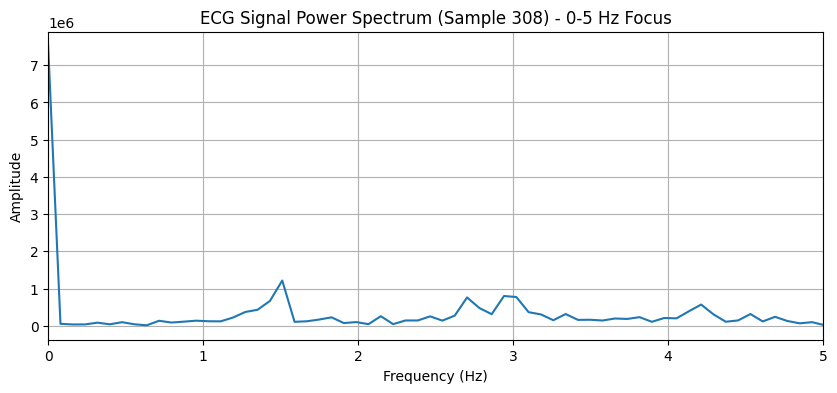

In [ ]:
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt
import numpy as np

# Select a random sample index
sample_index = np.random.randint(0, data.shape[0])  # Random index within data range

fs = 298  # Sampling rate (example, adjust if known)
n = data.shape[1]  # Number of samples
ecg_signal = data[sample_index, :, 0]

# Compute FFT
ecg_fft = np.abs(fft(ecg_signal))
freqs = fftfreq(n, 1 / fs)

# Plot Power Spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:n // 2], ecg_fft[:n // 2])  # Plot positive frequencies
plt.title(f"ECG Signal Power Spectrum (Sample {sample_index}) - 0-5 Hz Focus")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.xlim(0, 5)  # Focus on frequency range 0-5 Hz
plt.grid()
plt.show()


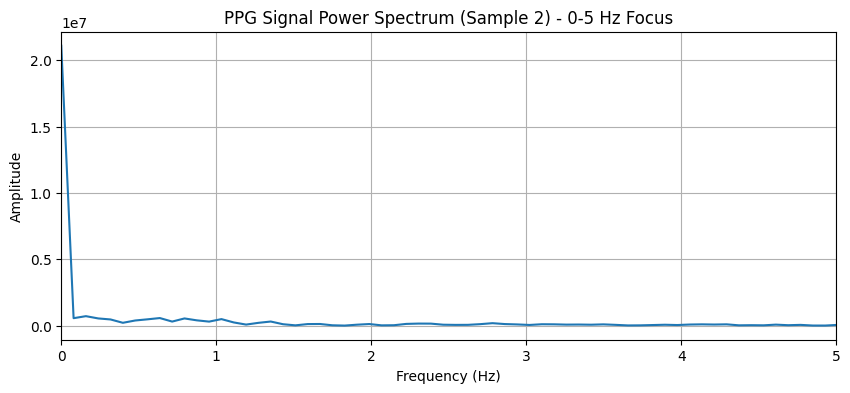

In [ ]:
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt
import numpy as np

# Select a random sample index
sample_index = np.random.randint(0, data.shape[0])  # Random index within data range

fs = 298  # Sampling rate (example, adjust if known)
n = data.shape[1]  # Number of samples
ppg_signal = data[sample_index, :,1]

# Compute FFT
ppg_fft = np.abs(fft(ppg_signal))
freqs = fftfreq(n, 1 / fs)

# Plot Power Spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:n // 2], ppg_fft[:n // 2])  # Plot positive frequencies
plt.title(f"PPG Signal Power Spectrum (Sample {sample_index}) - 0-5 Hz Focus")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.xlim(0, 5)  # Focus on frequency range 0-5 Hz
plt.grid()
plt.show()


In [ ]:
def detect_baseline_wander(signal, fs=250, cutoff=0.5):
    """
    Check if a signal has significant baseline wander based on power spectrum.

    Parameters:
        signal: ndarray
            Input signal (ECG or PPG).
        fs: int
            Sampling frequency.
        cutoff: float
            Frequency range to consider baseline wander.

    Returns:
        bool: True if baseline wander is significant, False otherwise.
    """
    from scipy.fft import fft, fftfreq
    n = len(signal)
    freqs = fftfreq(n, 1 / fs)
    fft_values = np.abs(fft(signal))

    # Calculate power in the 0–0.5 Hz range
    baseline_power = fft_values[(freqs >= 0) & (freqs < cutoff)].sum()
    total_power = fft_values.sum()
    baseline_ratio = baseline_power / total_power

    # Threshold for significant baseline wander (e.g., >10%)
    return baseline_ratio > 0.1


In [ ]:
def preprocess_signal(signal, fs=250):
    """
    Preprocess a signal by conditionally applying baseline removal.

    Parameters:
        signal: ndarray
            Input signal (ECG or PPG).
        fs: int
            Sampling frequency.

    Returns:
        filtered_signal: ndarray
            Preprocessed signal.
    """
    if detect_baseline_wander(signal, fs=fs):
        from scipy.signal import butter, filtfilt
        # Apply high-pass filter
        nyquist = 0.5 * fs
        cutoff = 0.5 / nyquist
        b, a = butter(2, cutoff, btype='high')
        return filtfilt(b, a, signal)
    else:
        # Return the original signal if baseline wander is negligible
        return signal

# Example: Apply to all ECG signals
preprocessed_ecg = np.array([preprocess_signal(data[i, :, 0]) for i in range(data.shape[0])])
# Example: Apply to all PPG signals
preprocessed_ppg = np.array([preprocess_signal(data[i, :, 1]) for i in range(data.shape[0])])

<ipython-input-35-051812c25edb>:24: RuntimeWarning: invalid value encountered in scalar divide
  baseline_ratio = baseline_power / total_power


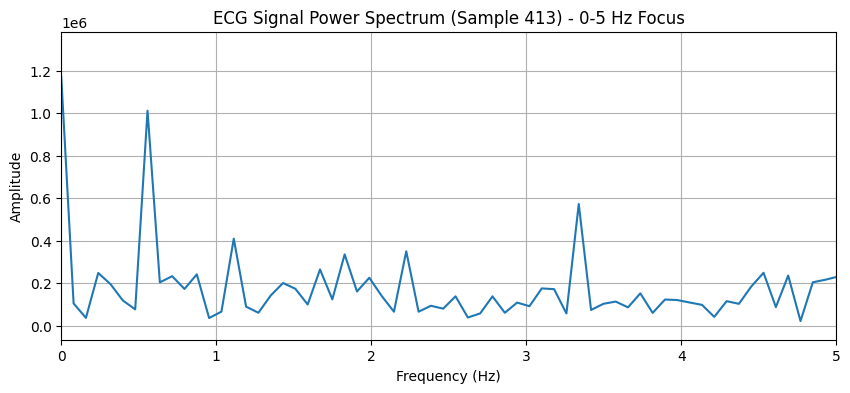

In [ ]:
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt
import numpy as np

# Select a random sample index
sample_index = np.random.randint(0, data.shape[0])  # Random index within data range
#sample_index=182
fs = 298  # Sampling rate (example, adjust if known)
n = data.shape[1]  # Number of samples
ecg_signal = preprocessed_ecg[sample_index, :]

# Compute FFT
ecg_fft = np.abs(fft(ecg_signal))
freqs = fftfreq(n, 1 / fs)

# Plot Power Spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:n // 2], ecg_fft[:n // 2])  # Plot positive frequencies
plt.title(f"ECG Signal Power Spectrum (Sample {sample_index}) - 0-5 Hz Focus")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.xlim(0, 5)  # Focus on frequency range 0-5 Hz
plt.grid()
plt.show()


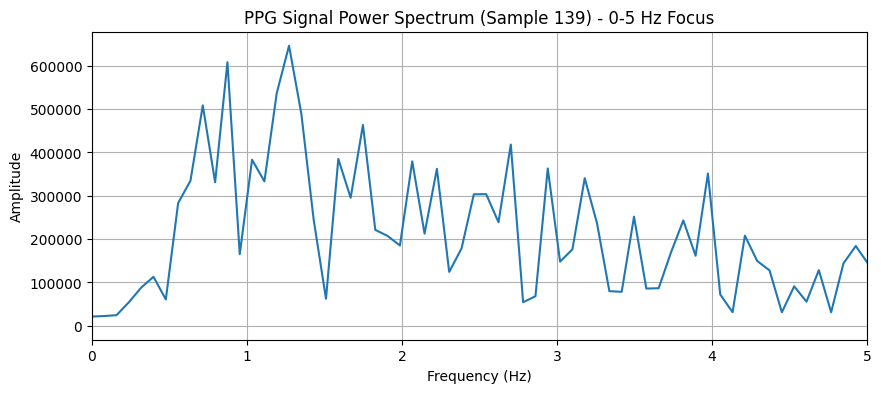

In [ ]:
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt
import numpy as np

# Select a random sample index
sample_index = np.random.randint(0, data.shape[0])  # Random index within data range
#sample_index=182
fs = 298  # Sampling rate (example, adjust if known)
n = data.shape[1]  # Number of samples
ppg_signal = preprocessed_ppg[sample_index, :]

# Compute FFT
ppg_fft = np.abs(fft(ppg_signal))
freqs = fftfreq(n, 1 / fs)

# Plot Power Spectrum
plt.figure(figsize=(10, 4))
plt.plot(freqs[:n // 2], ppg_fft[:n // 2])  # Plot positive frequencies
plt.title(f"PPG Signal Power Spectrum (Sample {sample_index}) - 0-5 Hz Focus")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.xlim(0, 5)  # Focus on frequency range 0-5 Hz
plt.grid()
plt.show()


In [ ]:
def normalize_signal(signal):
    """
    Normalize the signal to have zero mean and unit variance.

    Parameters:
        signal: ndarray
            Input signal (ECG or PPG).

    Returns:
        normalized_signal: ndarray
            Normalized signal.
    """
    return (signal - np.mean(signal)) / np.std(signal)

# Example: Apply normalization to preprocessed signals
normalized_ecg = np.array([normalize_signal(sig) for sig in preprocessed_ecg])
normalized_ppg = np.array([normalize_signal(sig) for sig in preprocessed_ppg])

<ipython-input-39-f8636ccb4e76>:13: RuntimeWarning: invalid value encountered in divide
  return (signal - np.mean(signal)) / np.std(signal)


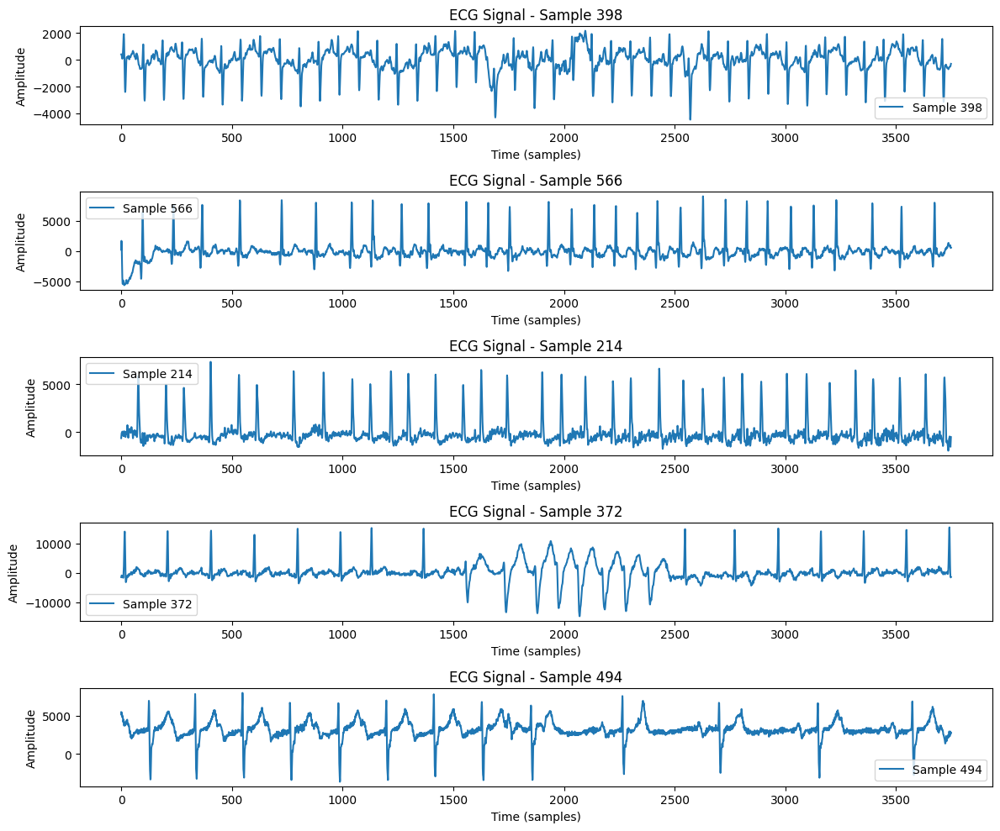

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

plt.figure(figsize=(12, 10))

# Plot 5 random ECG signals
for i in range(5):
    # Select a random sample index
    sample_index = random.randint(0, preprocessed_ecg.shape[0] - 1)  # Use 'data_cleaned' if preprocessing was done
    ecg_signal = preprocessed_ecg[sample_index, :]  # Extract ECG data

    # Plot ECG
    plt.subplot(5, 1, i + 1)
    plt.plot(ecg_signal, label=f"Sample {sample_index}")
    plt.title(f"ECG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()


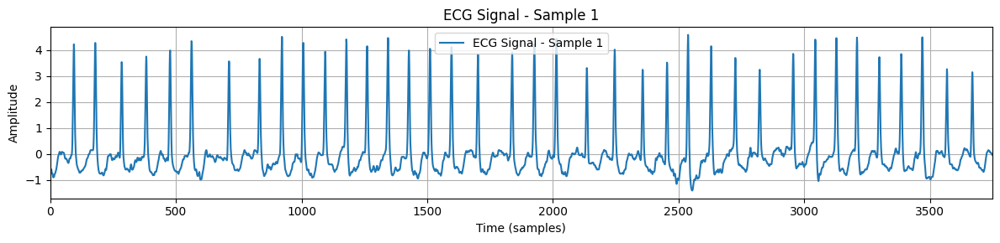

In [ ]:
# List of sample indices to display
variable = [1]
sample_indexes = variable  # Replace 'variable' with the list of desired indices (e.g., [0, 1, 2, 3, 4])

plt.figure(figsize=(12, len(sample_indexes) * 3))  # Adjust figure height based on the number of samples

for i, sample_index in enumerate(sample_indexes):
    ecg_signal = normalized_ecg[sample_index, :]  # Extract ECG signal for the sample
    signal_length = len(ecg_signal)  # Get the length of the ECG signal

    # Create a subplot for each ECG signal
    plt.subplot(len(sample_indexes), 1, i + 1)
    plt.plot(ecg_signal, label=f"ECG Signal - Sample {sample_index}")
    plt.title(f"ECG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.xlim(0, signal_length)  # Dynamically adjust x-axis to the full length of the signal

plt.tight_layout()
plt.show()


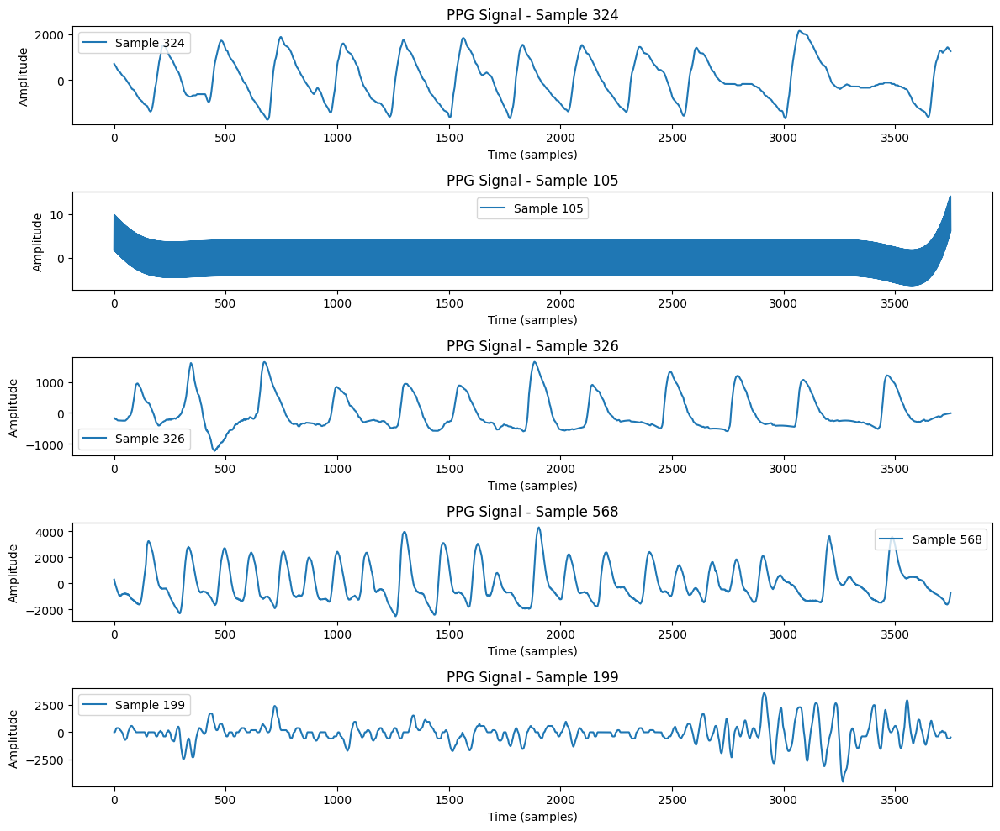

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

plt.figure(figsize=(12, 10))

# Plot 5 random ECG signals
for i in range(5):
    # Select a random sample index
    sample_index = random.randint(0, preprocessed_ppg.shape[0] - 1)  # Use 'data_cleaned' if preprocessing was done
    ppg_signal = preprocessed_ppg[sample_index, :]  # Extract ECG data

    # Plot ECG
    plt.subplot(5, 1, i + 1)
    plt.plot(ppg_signal, label=f"Sample {sample_index}")
    plt.title(f"PPG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()


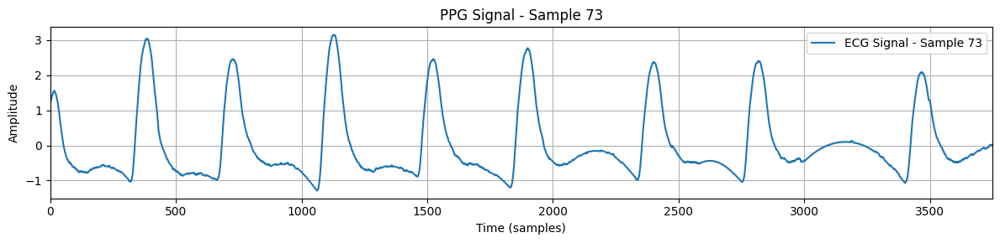

In [ ]:
# List of sample indices to display
variable = [73]
sample_indexes = variable  # Replace 'variable' with the list of desired indices (e.g., [0, 1, 2, 3, 4])

plt.figure(figsize=(12, len(sample_indexes) * 3))  # Adjust figure height based on the number of samples

for i, sample_index in enumerate(sample_indexes):
    ppg_signal = normalized_ppg[sample_index, :]  # Extract ECG signal for the sample
    signal_length = len(ppg_signal)  # Get the length of the ECG signal

    # Create a subplot for each ECG signal
    plt.subplot(len(sample_indexes), 1, i + 1)
    plt.plot(ppg_signal, label=f"ECG Signal - Sample {sample_index}")
    plt.title(f"PPG Signal - Sample {sample_index}")
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.xlim(0, signal_length)  # Dynamically adjust x-axis to the full length of the signal

plt.tight_layout()
plt.show()


In [ ]:
normalized_ppg.shape

(588, 3749)

In [ ]:
data.shape

(588, 3749, 2)

In [ ]:
# Expand dimensions to match the target shape (samples, timesteps, channels)
preprocessed_ecg_expanded = np.expand_dims(preprocessed_ecg, axis=-1)
preprocessed_ppg_expanded = np.expand_dims(preprocessed_ppg, axis=-1)

# Concatenate along the last axis to combine ECG and PPG
baseline_wander_data = np.concatenate((preprocessed_ecg_expanded, preprocessed_ppg_expanded), axis=-1)

# Verify the shape of the merged array
baseline_wander_data.shape

(588, 3749, 2)

In [ ]:
baseline_wander_data

array([[[  281.17465955,   -91.8338468 ],
        [ 1293.43842082,   -77.65830351],
        [ 2368.67874928,   -80.48816561],
        ...,
        [ -133.46342953,   -48.57351139],
        [ -113.97769566,   -34.03890997],
        [  -99.47156283,   -11.49171462]],

       [[ 1341.        ,  -142.98918391],
        [ 1370.        ,  -163.74695483],
        [ 1386.        ,  -199.528941  ],
        ...,
        [ 2054.        ,   382.41397273],
        [ 2038.        ,   356.31015532],
        [ 2015.        ,   288.25587243]],

       [[  -41.43228952,    10.01082668],
        [  -99.17801326,    15.03332851],
        [ -192.93706482,     7.05542791],
        ...,
        [ -658.60047022,    99.56798657],
        [ -589.47112324,    95.8307603 ],
        [ -549.41116895,    63.08518627]],

       ...,

       [[  -82.        ,     6.68765323],
        [ -110.        ,    10.75882595],
        [ -128.        ,     6.83083282],
        ...,
        [ 1507.        ,     2.94089911],
     

## eliminate bad data

In [ ]:
import numpy as np

def remove_rows(data, indexes):
    """
    Remove specific rows from a NumPy array based on given indexes.

    Parameters:
        data (np.ndarray): The input array.
        indexes (list or np.ndarray): List of row indexes to remove.

    Returns:
        np.ndarray: The modified array with specified rows removed.
    """
    mask = np.ones(data.shape[0], dtype=bool)  # Create a mask for all rows
    mask[indexes] = False  # Set unwanted rows to False
    return data[mask, :, :]  # Keep only the True rows

# Specify row indexes to remove
indexes_to_remove = [124, 257, 251, 416]  # Change this list as needed

# Apply the function
removed_rows_data = remove_rows(baseline_wander_data, indexes_to_remove)

print("Original shape:", data.shape)
print("New shape:", removed_rows_data.shape)


Original shape: (588, 3749, 2)
New shape: (584, 3749, 2)


In [ ]:
import numpy as np

# Remove rows from both `removed_rows_data` and `labels`
removed_indexes = [124, 257, 251, 416]

# Delete corresponding rows from labels
labels = np.delete(labels, removed_indexes, axis=0)


In [ ]:
labels = labels.reshape(-1, 1)


In [ ]:
labels.shape

(584, 1)

## upsampling

In [ ]:
import numpy as np

def jittering(signal, sigma=0.01):
    """
    Apply random Gaussian noise (jittering) to an ECG/PPG signal.

    Parameters:
    - signal: numpy array, the original signal
    - sigma: float, standard deviation of noise

    Returns:
    - Augmented signal with added noise
    """
    noise = np.random.normal(loc=0, scale=sigma, size=signal.shape)
    return signal + noise


In [ ]:
from scipy.interpolate import CubicSpline

def magnitude_warping(signal, sigma=0.2, knot=4):
    """
    Apply magnitude warping to ECG & PPG signals using cubic spline interpolation.

    Parameters:
    - signal: numpy array, shape (timesteps, 2) -> (3749, 2)
    - sigma: float, standard deviation of the warping curve
    - knot: int, number of knots for spline interpolation

    Returns:
    - Augmented signal with magnitude warping, same shape as input
    """
    timesteps = signal.shape[0]
    orig_steps = np.linspace(0, 1, num=timesteps)

    # Apply warping to both channels (ECG and PPG) separately
    warped_signal = np.zeros_like(signal)
    for i in range(2):  # Iterate over ECG (0) and PPG (1) channels
        random_points = np.random.normal(loc=1.0, scale=sigma, size=(knot+2,))
        warp_curve = CubicSpline(np.linspace(0, 1, num=knot+2), random_points)(orig_steps)
        warped_signal[:, i] = signal[:, i] * warp_curve  # Apply warping

    return warped_signal


In [ ]:
from scipy.interpolate import CubicSpline

def magnitude_warping(signal, sigma=0.2, knot=4):
    """
    Apply magnitude warping to ECG & PPG signals using cubic spline interpolation.

    Parameters:
    - signal: numpy array, shape (timesteps, 2) -> (3749, 2)
    - sigma: float, standard deviation of the warping curve
    - knot: int, number of knots for spline interpolation

    Returns:
    - Augmented signal with magnitude warping, same shape as input
    """
    timesteps = signal.shape[0]
    orig_steps = np.linspace(0, 1, num=timesteps)

    # Generate the same warping curve for both channels
    random_points = np.random.normal(loc=1.0, scale=sigma, size=(knot+2,))
    warp_curve = CubicSpline(np.linspace(0, 1, num=knot+2), random_points)(orig_steps)

    # Reshape to (3749, 1) for broadcasting
    warp_curve = warp_curve.reshape(-1, 1)

    # Apply magnitude warping to both ECG and PPG channels
    return signal * warp_curve


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def preview_augmented_signal(original_signal, augmented_signal):
    """
    Visualize original and augmented signals for comparison.
    """
    plt.figure(figsize=(10, 5))
    plt.plot(original_signal, label="Original Signal")
    plt.plot(augmented_signal, label="Augmented Signal", linestyle='dashed')
    plt.legend()
    plt.title("Original vs Augmented Signal")
    plt.show()

def augment_ecg_ppg(X, y, target_classes, augmentation_factor=2):
    """
    Apply jittering and magnitude warping to ECG & PPG signals to balance an imbalanced dataset.

    Parameters:
    - X: numpy array, shape (samples, timesteps, 2) -> (584, 3749, 2)
    - y: numpy array, labels corresponding to X
    - target_classes: list, classes to oversample
    - augmentation_factor: int, how many augmented samples per original sample

    Returns:
    - Augmented dataset (X_balanced, y_balanced)
    """
    X_aug, y_aug = [], []

    for i in range(len(X)):
        if y[i] in target_classes:  # Apply augmentation only to minority classes
            for _ in range(augmentation_factor):
                # Preview original and augmented signal
                aug_signal = jittering(X[i])  # Apply jittering
                aug_signal = magnitude_warping(aug_signal)  # Apply magnitude warping
                preview_augmented_signal(X[i], aug_signal)  # Visualize the signals

                X_aug.append(aug_signal)
                y_aug.append(y[i])

    X_aug = np.array(X_aug)
    y_aug = np.array(y_aug)

    # Combine original and augmented data
    X_balanced = np.concatenate([X, X_aug])
    y_balanced = np.concatenate([y, y_aug])

    return X_balanced, y_balanced


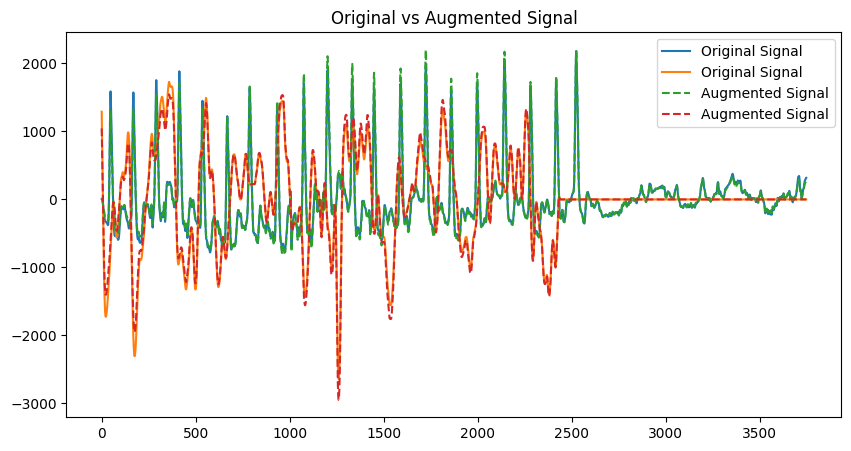

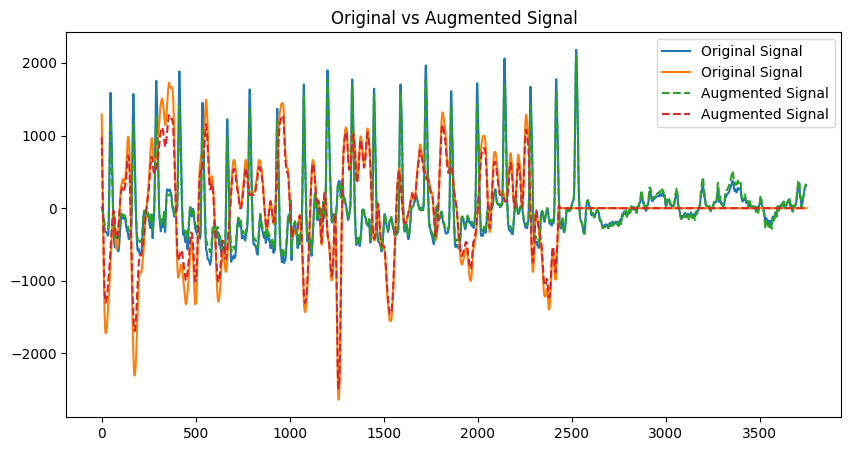

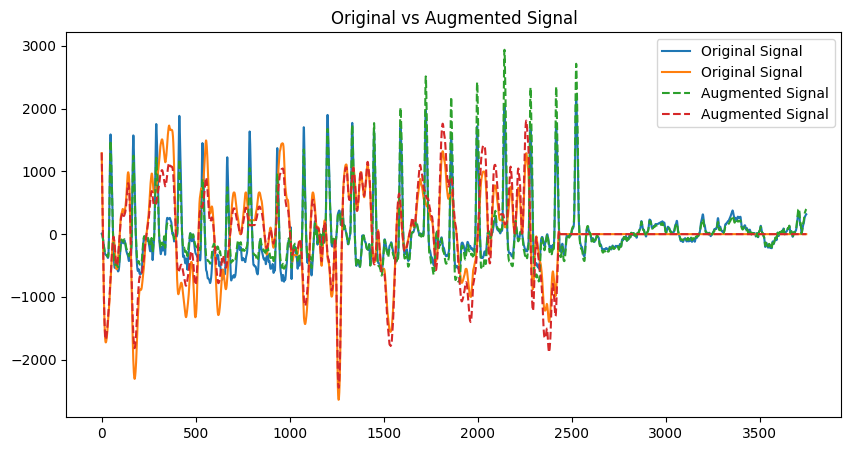

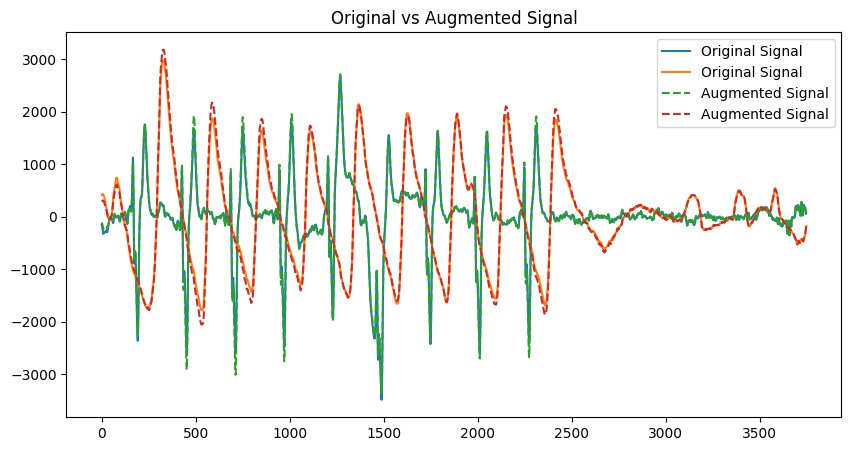

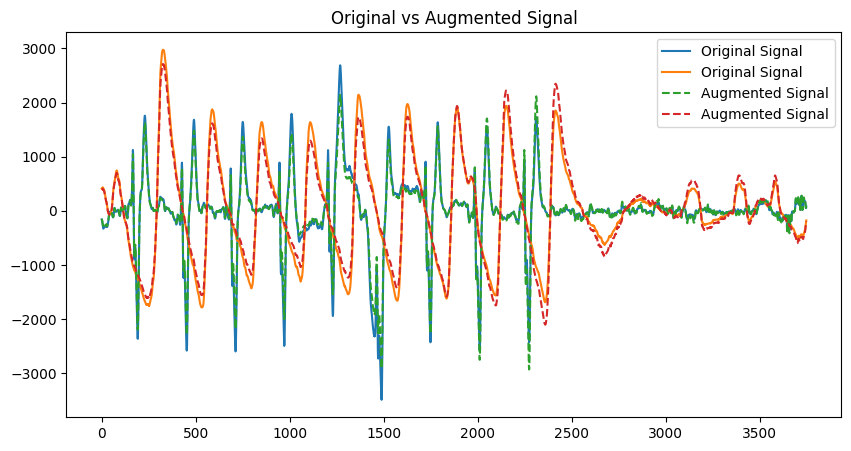

...

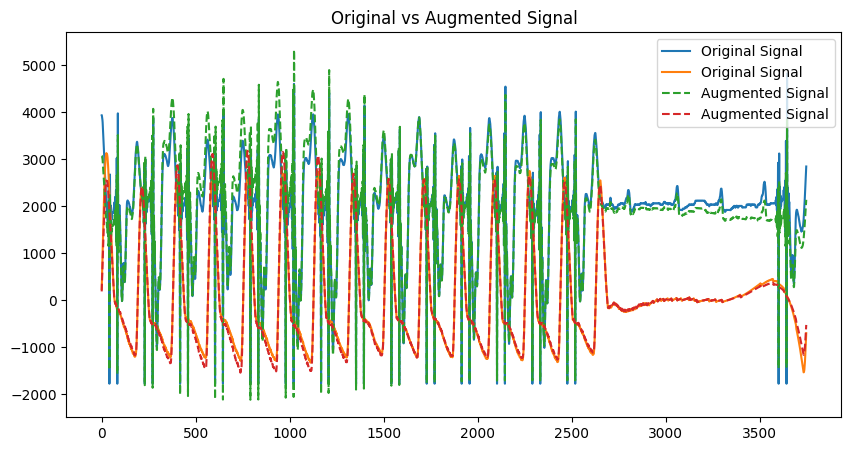

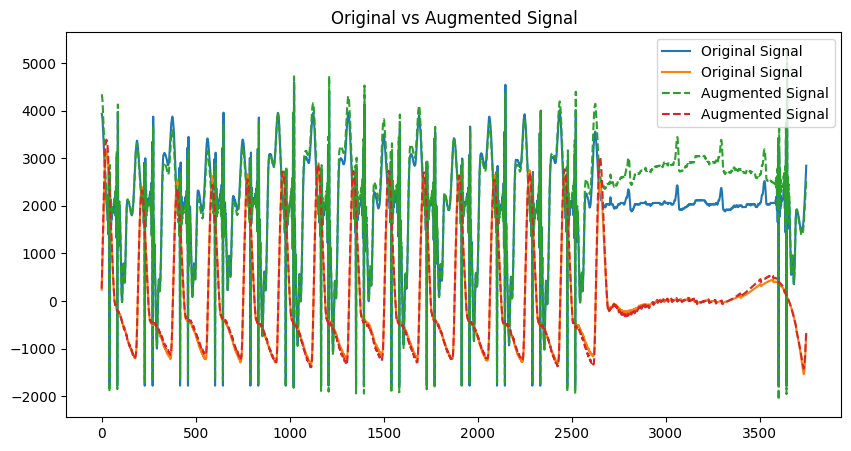

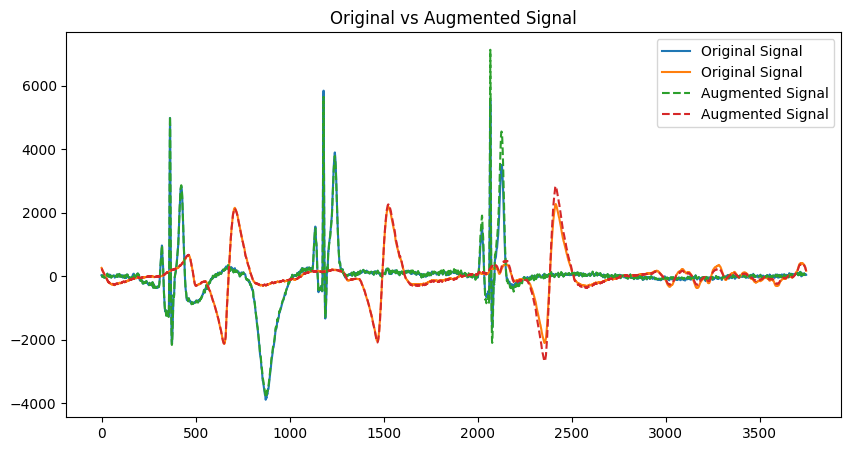

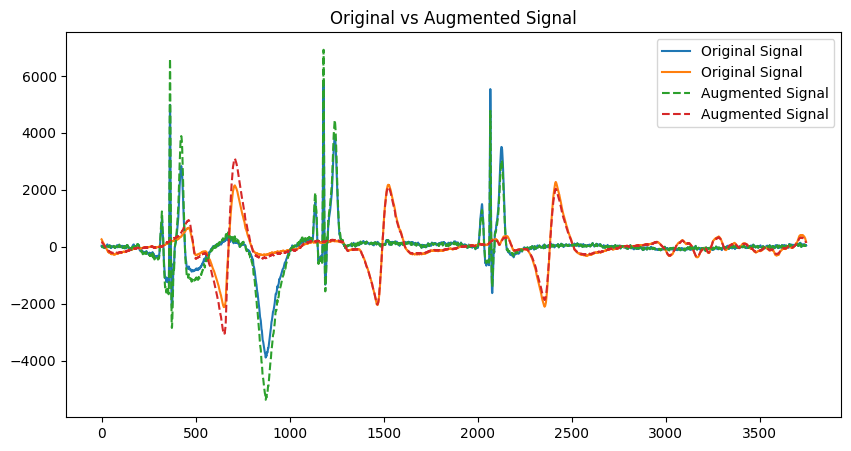

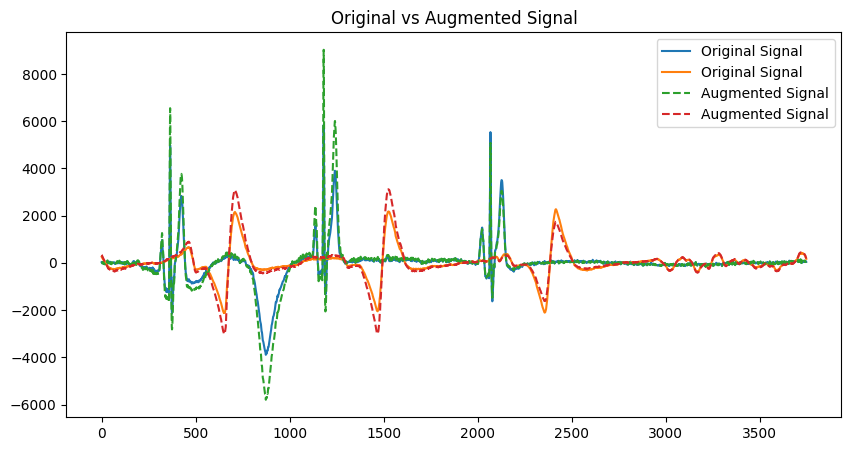

In [ ]:
# Example Usage:
target_classes = ["ventricular_flutter_fib", "Asystole"]  # Example: Oversample classes 0 and 2
X_balanced, y_balanced = augment_ecg_ppg(removed_rows_data, labels, target_classes, augmentation_factor=3)


In [ ]:
X_balanced.shape

(716, 3749, 2)

###training-baseline wander removed signal

In [ ]:
# Make sure y is a 1D array (shape: (x,))
y_balanced = y_balanced.ravel()
y_balanced.shape

(716,)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import numpy as np

data2=X_balanced
labels=y_balanced
# Normalize the data (optional, depending on range)
data2_normalized = (data2 - np.min(data2)) / (np.max(data2) - np.min(data2))

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(data2_normalized, labels, test_size=0.2, random_state=42)

# Encode labels (if not already one-hot encoded)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# One-hot encode the labels
y_train_onehot = to_categorical(y_train_encoded)
y_test_onehot = to_categorical(y_test_encoded)

# Print shapes to confirm
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train_onehot.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test_onehot.shape}")


X_train shape: (572, 3749, 2), y_train shape: (572, 5)
X_test shape: (144, 3749, 2), y_test shape: (144, 5)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.regularizers import l2

# Define a simpler pure CNN model
model2 = Sequential([
    # Input Layer
    Input(shape=(3749, 2), name="inputs_cnn"),

    # First Convolutional Block
    Conv1D(filters=32, kernel_size=7, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_1"),
    BatchNormalization(name="batch_norm_1"),
    MaxPooling1D(pool_size=3, name="max_pooling1d_1"),
    Dropout(0.3, name="dropout_1"),

    # Second Convolutional Block
    Conv1D(filters=64, kernel_size=5, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_2"),
    BatchNormalization(name="batch_norm_2"),
    MaxPooling1D(pool_size=3, name="max_pooling1d_2"),
    Dropout(0.3, name="dropout_2"),

    # Third Convolutional Block
    Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_3"),
    BatchNormalization(name="batch_norm_3"),
    MaxPooling1D(pool_size=2, name="max_pooling1d_3"),
    Dropout(0.4, name="dropout_3"),

    # Flatten and Fully Connected Layers
    Flatten(name="flatten"),
    Dense(64, activation='relu', kernel_regularizer=l2(0.001), name="dense_1"),
    Dropout(0.5, name="dropout_4"),
    Dense(5, activation='softmax', name="main_output")  # Adjust the output size for the number of classes
])

# Compile the model
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model2.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)                    │ (None, 3743, 32)            │             480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm_1 (BatchNormalization)    │ (None, 3743, 32)            │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 1247, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1247, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 1243, 64)            │          10,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm_2 (BatchNormalization)    │ (None, 1243, 64)            │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 414, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 414, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 412, 128)            │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm_3 (BatchNormalization)    │ (None, 412, 128)            │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 206, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 206, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 26368)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │       1,687,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ main_output (Dense)                  │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,724,325 (6.58 MB)

 Trainable params: 1,723,877 (6.58 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define file path to save best weights
checkpoint_path = "/content/drive/Othercomputers/MyLaptop/Downloads/PhysioNet CSV Clean-20230629T041657Z-001/upsampled03.weights.h5"

# Model checkpoint to save best weights based on validation accuracy
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=True,
    verbose=0  # Suppress save messages
)

In [ ]:
# Early stopping based on validation accuracy
early_stopping = EarlyStopping(
    monitor='val_accuracy', patience=200, restore_best_weights=True, verbose=0
)

# Train the model
history = model2.fit(
    X_train, y_train_onehot,
    validation_data=(X_test, y_test_onehot),
    epochs=100,
    batch_size=32,
    verbose=1,  # Set to 0 for no output, 1 for progress bar, or 2 for one line per epoch
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 15s 841ms/step - accuracy: 0.9754 - loss: 0.6130 - val_accuracy: 0.9236 - val_loss: 0.8772
Epoch 2/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 487ms/step - accuracy: 0.9821 - loss: 0.5882 - val_accuracy: 0.5417 - val_loss: 4.1927
Epoch 3/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 395ms/step - accuracy: 0.9758 - loss: 0.6504 - val_accuracy: 0.4306 - val_loss: 6.9493
Epoch 4/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 456ms/step - accuracy: 0.9667 - loss: 0.6235 - val_accuracy: 0.5208 - val_loss: 2.5667
Epoch 5/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 457ms/step - accuracy: 0.9851 - loss: 0.5989 - val_accuracy: 0.4653 - val_loss: 5.0584
Epoch 6/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 413ms/step - accuracy: 0.9583 - loss: 0.6661 - val_accuracy: 0.5833 - val_loss: 3.9184
Epoch 7/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 352ms/step - accuracy: 0.9897 - loss: 0.6595 - val_accuracy: 0.3333 - val_loss: 7.0425
Epoch 8/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 12s 431ms/step - accuracy: 0.9734 - loss: 0.6969 - val

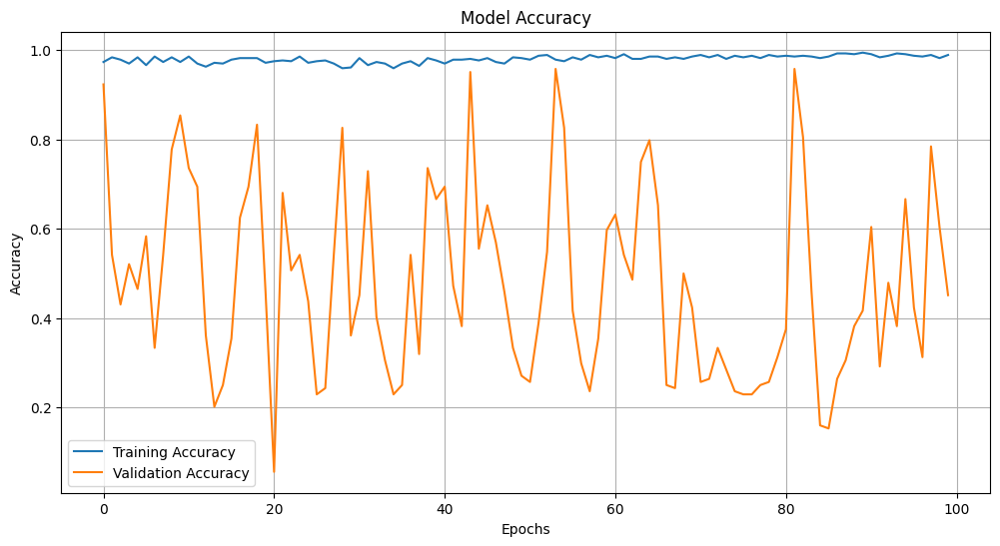

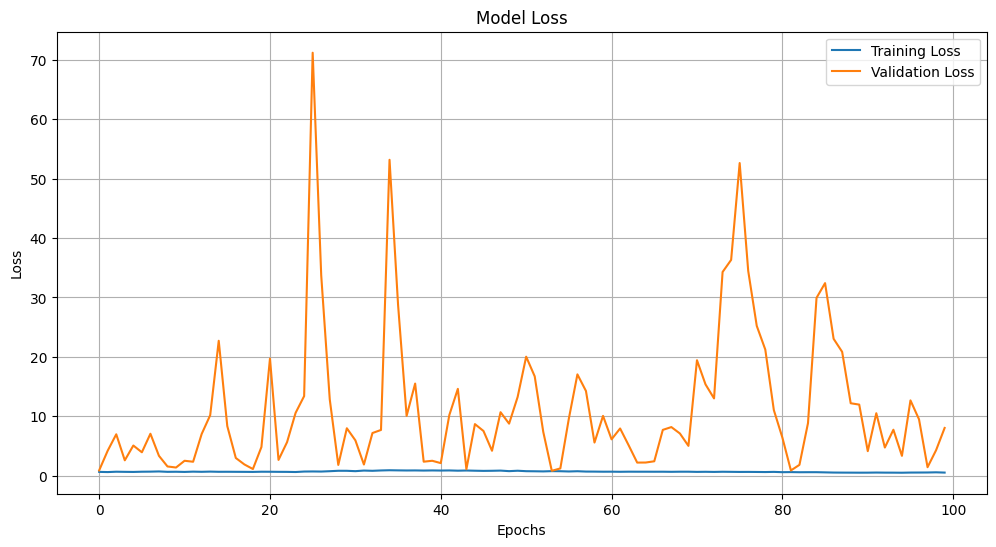

In [ ]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

# Plot loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, BatchNormalization, MaxPooling1D, Dropout, Flatten, Dense
from tensorflow.keras.regularizers import l2

# Define the model architecture
def create_model():
    inputs = Input(shape=(3749, 2), name="inputs_cnn")

    # First Convolutional Block
    x = Conv1D(filters=32, kernel_size=7, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_1")(inputs)
    x = BatchNormalization(name="batch_norm_1")(x)
    x = MaxPooling1D(pool_size=3, name="max_pooling1d_1")(x)
    x = Dropout(0.3, name="dropout_1")(x)

    # Second Convolutional Block
    x = Conv1D(filters=64, kernel_size=5, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_2")(x)
    x = BatchNormalization(name="batch_norm_2")(x)
    x = MaxPooling1D(pool_size=3, name="max_pooling1d_2")(x)
    x = Dropout(0.3, name="dropout_2")(x)

    # Third Convolutional Block
    x = Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.001), name="conv1d_3")(x)
    x = BatchNormalization(name="batch_norm_3")(x)
    x = MaxPooling1D(pool_size=2, name="max_pooling1d_3")(x)
    x = Dropout(0.4, name="dropout_3")(x)

    # Fully Connected Layers
    x = Flatten(name="flatten")(x)
    x = Dense(64, activation='relu', kernel_regularizer=l2(0.001), name="dense_1")(x)
    x = Dropout(0.5, name="dropout_4")(x)
    outputs = Dense(5, activation='softmax', name="main_output")(x)  # Adjusted for 5-class classification

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create the model
model = create_model()

# Load the saved weights
weights_path = "drive/Othercomputers/MyLaptop/Downloads/PhysioNet CSV Clean-20230629T041657Z-001/upsampled03.weights.h5"
model.load_weights(weights_path)  # Correctly loading weights into the model

# Compile the model (important for evaluation)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

print("Model architecture defined, and weights loaded successfully!")


Model architecture defined, and weights loaded successfully!


In [ ]:
from sklearn.metrics import classification_report, f1_score
import numpy as np

# Predict class probabilities
y_pred_prob = model.predict(X_test)

# Convert probabilities to class predictions
y_pred = y_pred_prob.argmax(axis=1)  # Get the index of the maximum probability
y_true = y_test_onehot.argmax(axis=1)  # Convert one-hot encoding back to class labels

# Generate classification report with 4 decimal places
report = classification_report(y_true, y_pred, target_names=[f"Class {i}" for i in range(y_test_onehot.shape[1])], digits=4)
print(report)

# Calculate and format F1 scores per class (rounded to 4 decimal places)
f1_per_class = f1_score(y_true, y_pred, average=None)
f1_per_class = np.round(f1_per_class, 4)  # Round to 4 decimal places
print("F1 Score per Class:", f1_per_class)


4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000        35
     Class 1     1.0000    0.8667    0.9286        15
     Class 2     0.9344    1.0000    0.9661        57
     Class 3     1.0000    1.0000    1.0000         4
     Class 4     0.9355    0.8788    0.9062        33

    accuracy                         0.9583       144
   macro avg     0.9740    0.9491    0.9602       144
weighted avg     0.9593    0.9583    0.9577       144

F1 Score per Class: [1.     0.9286 0.9661 1.     0.9062]
